# Volume Profile Visible Range
> An indicator to visualise price entries 

- toc: false
- badges: false
- comments: true
- categories: [Finance, Blockchain]
- image: images/chart-preview.png

In [5]:
#hide
#@title Imports
# change to blog master <- MAKE SURE
# _notebooks/2021-08-06-Volume-Profile-Visible-Range.ipynb
import pandas as pd
import numpy as np
from scipy import stats, signal
import plotly.express as px
import plotly.graph_objects as go
import requests
import datetime

import numpy as np
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import seaborn as sns
import random
sns.set()
!pip install mplfinance
# More Plotting libaries 
from mplfinance.original_flavor import candlestick_ohlc
from matplotlib.pylab import date2num
from dateutil.relativedelta import relativedelta


!pip install yfinance
import yfinance as yf

In [6]:
#hide
#@title plot
def plot(tick,p=182,kk=False):
  """
  Give a ticker and period in days, the VPVR is plotted and resistant lines are shown
  """

  ### Data functions
  if (kk==False):
    ticker = yf.Ticker(tick)
    df = ticker.history(period=f'{p}d',interval='1d')
    cp = df.Close[len(df)-1]
  elif (kk==True):
    link = f'https://openapi-v2.kucoin.com/api/v1/market/candles?type=1day&symbol={tick}'
    r = requests.get(link)	
    df = pd.DataFrame.from_records(r.json()['data'])
    df.columns = ['Time', 'Open', 'Close', 'High', 'Low', 'Volume', 'Turnover']
    df['Time'] = pd.to_datetime(df['Time'], unit='s', errors='coerce')
    df = df.set_index('Time')
    df = df.head(p) 
    for col in df.columns:
      df[col] = pd.to_numeric(df[col])
    cp = df.Close[0]


  ### Density functions 
  kde_factor = 0.1
  num_samples = 500
  kde = stats.gaussian_kde(df['Close'],weights=df['Volume'],bw_method=kde_factor)
  xr = np.linspace(df['Close'].min(),df['Close'].max(),num_samples)
  kdy = kde(xr)
  ticks_per_sample = (xr.max() - xr.min()) / num_samples

  peaks,peak_props = signal.find_peaks(kdy)
  pkx1 = xr[peaks]
  pky1 = kdy[peaks]


  min_prom = 0
  peaks,peak_props = signal.find_peaks(kdy, prominence=min_prom)
  pkx = xr[peaks]
  pky = kdy[peaks]


  left_base = peak_props['left_bases']
  right_base = peak_props['right_bases']
  line_x = pkx
  line_y0 = pky
  line_y1 = pky - peak_props['prominences']

  ### Plotting functions 
  sns.set_style("whitegrid")
  plt.style.use('seaborn-dark-palette')


  f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,5),gridspec_kw={'width_ratios': [1, 2.5]}, dpi= 300, 
                               facecolor='w', edgecolor='k', sharey=True)
  
  ax1.scatter(pky1,pkx1,marker='>',color='#06d6a0', zorder=10)
  ax1.plot(kdy,xr,color='#d62828')
  ax1.hist(df['Close'],weights=df['Volume'],  bins=50, density=True, 
           orientation='horizontal', alpha = 0.1)
  # print('='*50)
  # print(f'{tick}')
  proms = []
  for x, y0, y1 in zip(pkx, pky, line_y1):
    ax1.hlines(x,y0,y1, color='#06d6a0', alpha=1)   
    proms.append([x,y0-y1])
  #   print(f'This prominance level at {round(x,2)}:{round(prom,2)}') 
  # print('='*50)
  
  #determine the strongest support
  proms = pd.DataFrame.from_records(proms)
  print()
  proms.columns  = ['p','pp']
  sp = proms[proms['pp'] == proms['pp'].max()]['p'].reset_index()
  print(tick,' | % distance from strongest support: ', round(100*((sp['p'][0]-cp)/cp),2))


  # make the lines for the plot
  nn = pky - line_y1
  normalized_y1 = nn / np.sqrt(np.sum(nn**2))
  for i, txt in enumerate(pkx1):
    ax2.annotate(round(txt,2), (df.index[0], pkx1[i]))
  for x,a in zip(pkx,normalized_y1) :
    ax2.plot(df.index, [x]*len(df.index), color='#06d6a0', alpha= a) #change this normalised if you want gradients
  ax2.plot(df.index, df['Close'], alpha = 1)

  ax1.set_title(f'{tick} Volume Profile Visible Range (p={p}d)')
  ax2.set_title(f'{tick} Price')
  ax2.set_xlabel('Date')
  ax1.set_xlabel('Volume profile (partial sums)')
  ax1.set_ylabel('Price $')



{% include alert.html text="Roses are red, violets are blue. This is not financial advice, I genuinely have no clue." %}


### So what is the Volume Profile Visible Range (VPVR)? 

*It would be classified as a volume profile tool most traders use. It appears next to price levels as a histogram. It displays the volume traded at a given price level within a period of time.*

#### ... and so what?

Well when used in the right conditions this tool can show at which price points the highest volumes of an asset were traded. This can be a proxy for a price entry point. 

#### ... but how will you know if it's significant? 

We can take volume nodes and measure the prominence. The prominence is defined as the vertical distance between the peak and its lowest contour line and could be seen as indicator of how significant a volume node is. 
[*Explanation*](https://medium.com/swlh/how-to-analyze-volume-profiles-with-python-3166bb10ff24)

#### WTF does that even mean? 

In the below example we can see the largegest prominence occurs at $35,801. We could say the most significant accumaltion occured at this price point in the past 365 days (*shown by p=365d*). 

![VPVR](https://raw.githubusercontent.com/CodeByHarri/blog/master/images/vpvr.PNG)

#### Okay, but can i do? 

Trick question, I cant give you financial advice.😂 That being said, given the fundamentals of the asset class are secure it could be used as indicator for price entry. 

*   *How far away from the most signficant volume node is the asset trading?* 
*   *Is a new signficant volume node forming?* 


## Here are some crypto projects I have my eyes on 👀.










Time executed 2021-09-07 10:35:11.632149

BTC-USD  | % distance from strongest support:  -29.91

ETH-USD  | % distance from strongest support:  -51.94

ADA-USD  | % distance from strongest support:  -53.15

SOL1-USD  | % distance from strongest support:  -79.43

MATIC-USD  | % distance from strongest support:  10.81

LINK-USD  | % distance from strongest support:  -23.02


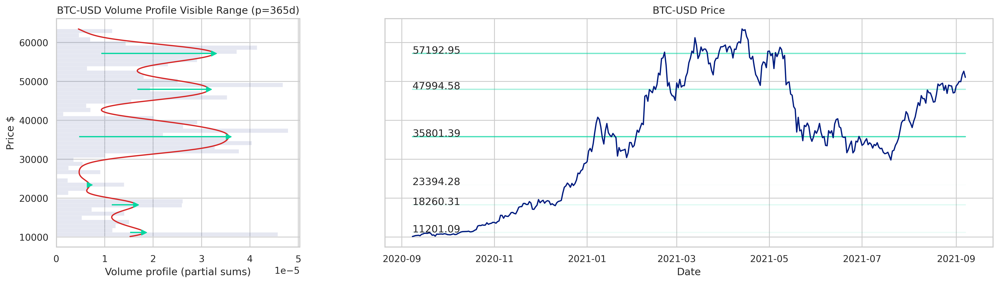

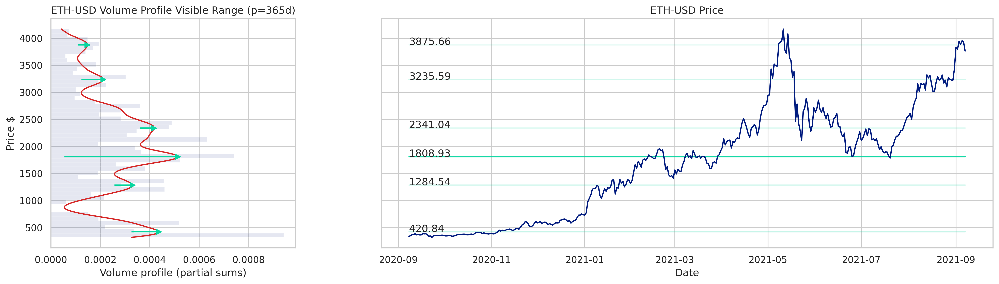

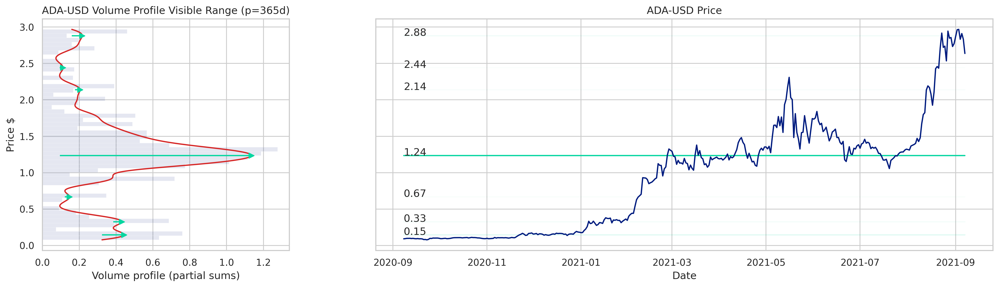

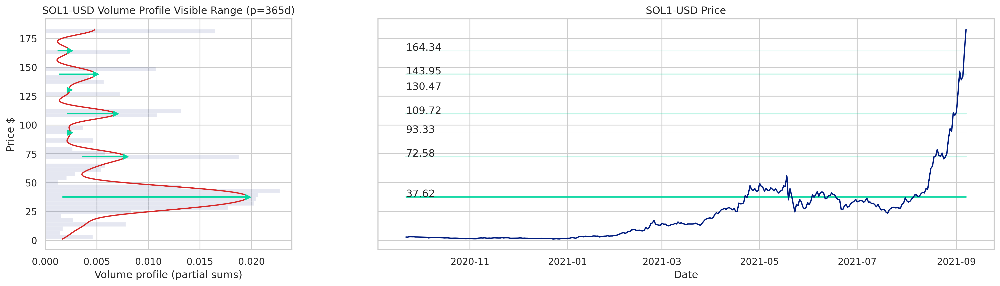

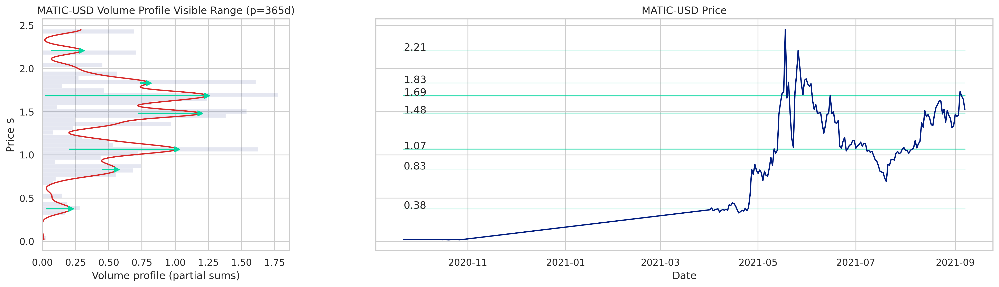

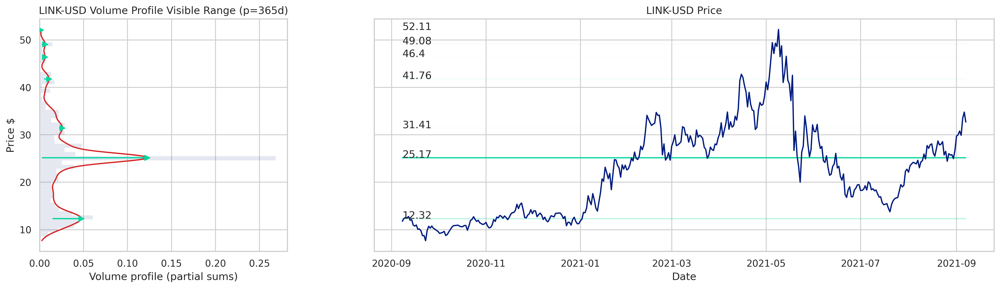

In [14]:
#hide_input
print('Time executed:', datetime.datetime.now())
ticks = ['BTC-USD','ETH-USD','ADA-USD','SOL1-USD','MATIC-USD', 'LINK-USD']
for tick in ticks: 
  plot(tick, p=365)


NDQ.AX  | % distance from strongest support:  -17.56

ASIA.AX  | % distance from strongest support:  3.36

CLNE.AX  | % distance from strongest support:  -4.16

IOZ.AX  | % distance from strongest support:  -21.55

EMN.AX  | % distance from strongest support:  8.55


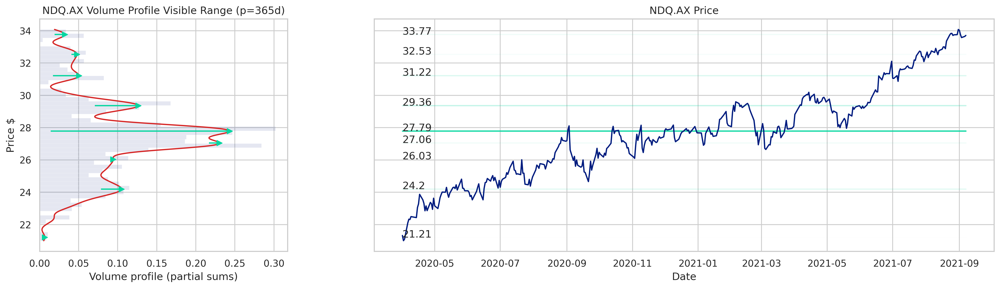

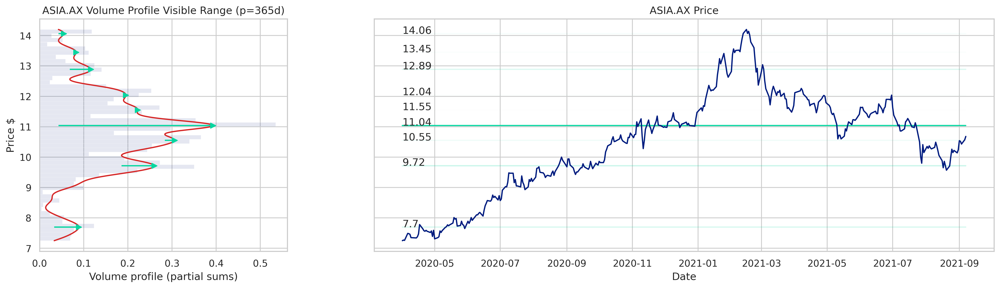

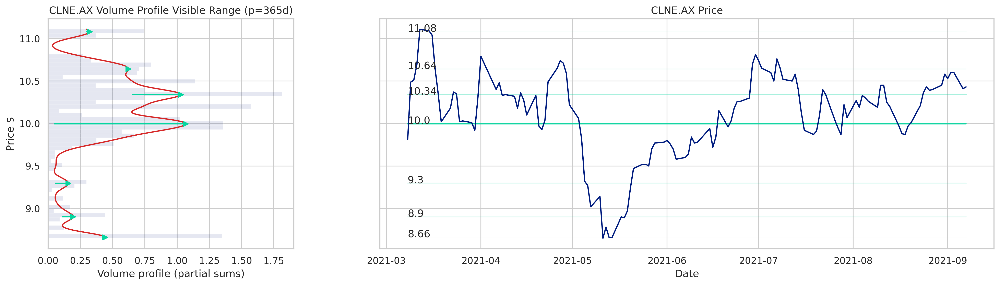

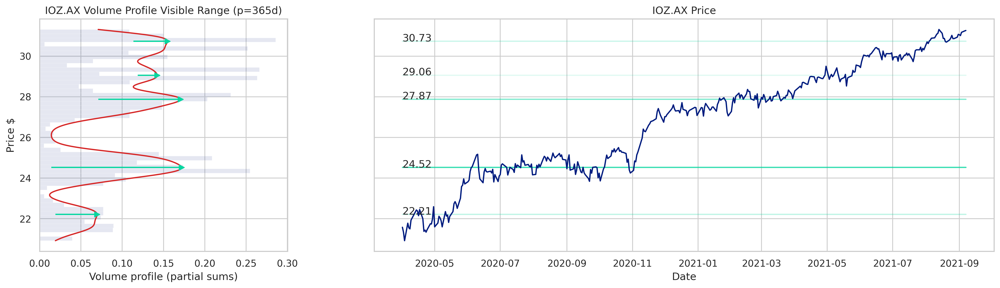

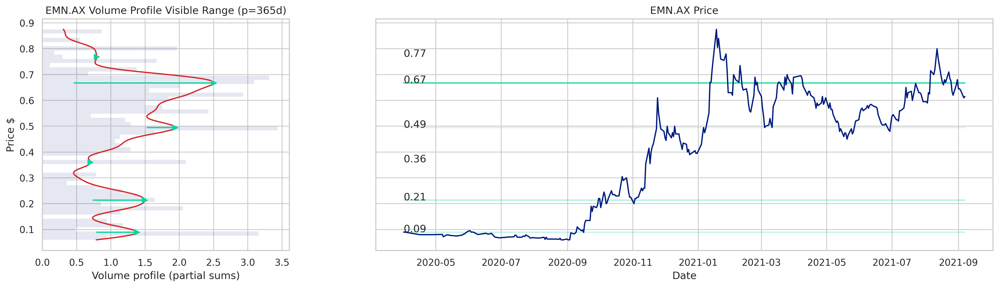

In [8]:
#hide
ticks = ['NDQ.AX','ASIA.AX','CLNE.AX','IOZ.AX','EMN.AX']
for tick in ticks: 
  plot(tick, p=365)

## Here are some **higher risk** crypto projects I have my eyes on 👀.

In [11]:
#hide
KT = ['DAG-USDT','LTX-USDT', 'NOIA-USDT', 'COTI-USDT', 'UTK-BTC', 'OCEAN-BTC', 'ORN-USDT', 
      'ALEPH-USDT', 'CHR-USDT','ALBT-USDT','UOS-USDT',
      'CGG-USDT', 'AVA-USDT', 'SOUL-USDT', 'GOVI-USDT']

Time executed: 2021-09-07 10:35:32.694817

DAG-USDT  | % distance from strongest support:  -38.31

LTX-USDT  | % distance from strongest support:  -80.09

NOIA-USDT  | % distance from strongest support:  -26.4

COTI-USDT  | % distance from strongest support:  -63.1

UTK-BTC  | % distance from strongest support:  45.79

OCEAN-BTC  | % distance from strongest support:  34.16

ORN-USDT  | % distance from strongest support:  -9.55

ALEPH-USDT  | % distance from strongest support:  -14.96

CHR-USDT  | % distance from strongest support:  -17.47

ALBT-USDT  | % distance from strongest support:  -43.97

UOS-USDT  | % distance from strongest support:  -42.55

CGG-USDT  | % distance from strongest support:  -73.67

AVA-USDT  | % distance from strongest support:  -52.64

SOUL-USDT  | % distance from strongest support:  -41.6

GOVI-USDT  | % distance from strongest support:  71.74


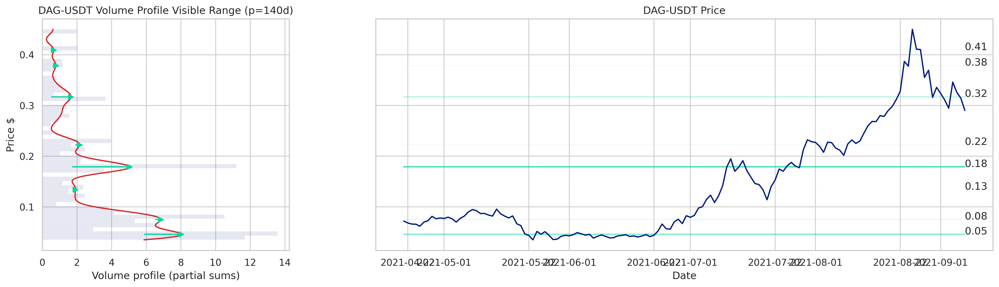

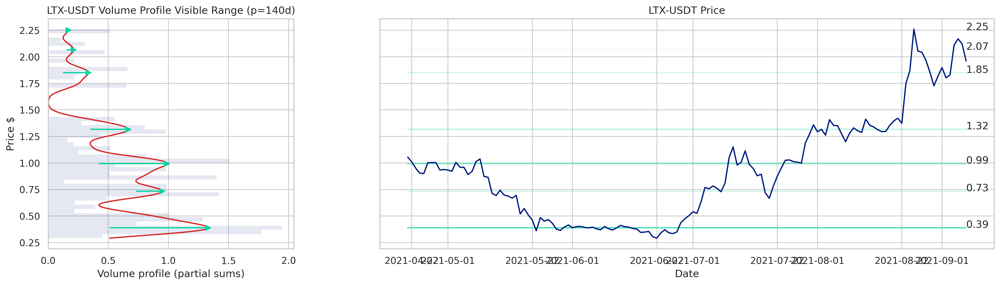

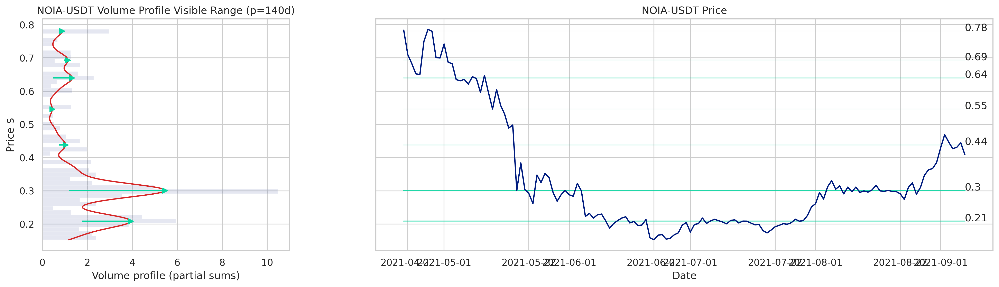

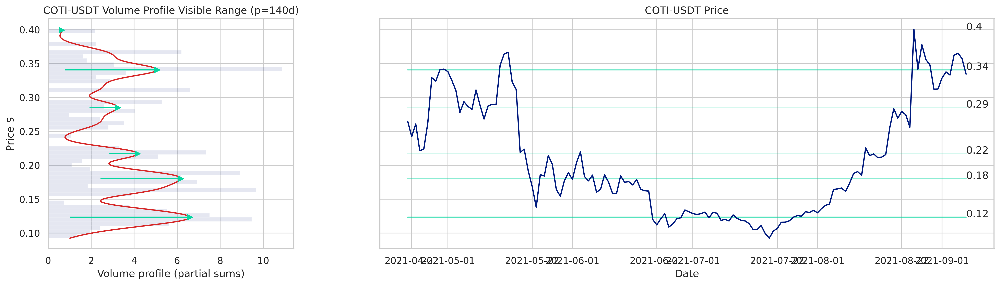

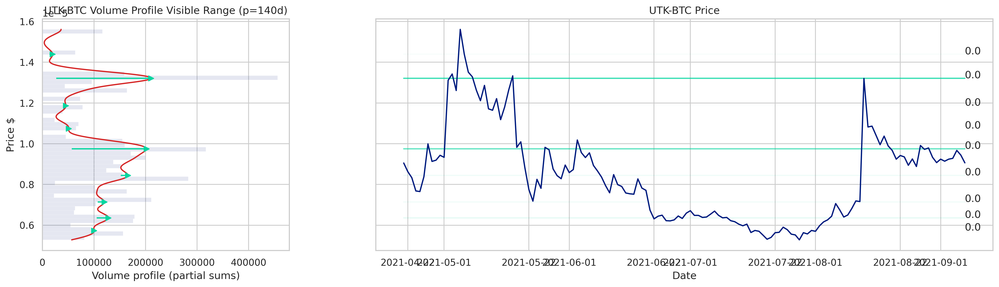

...

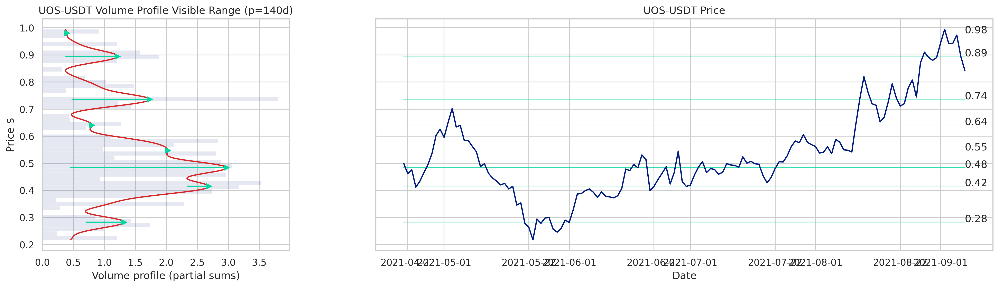

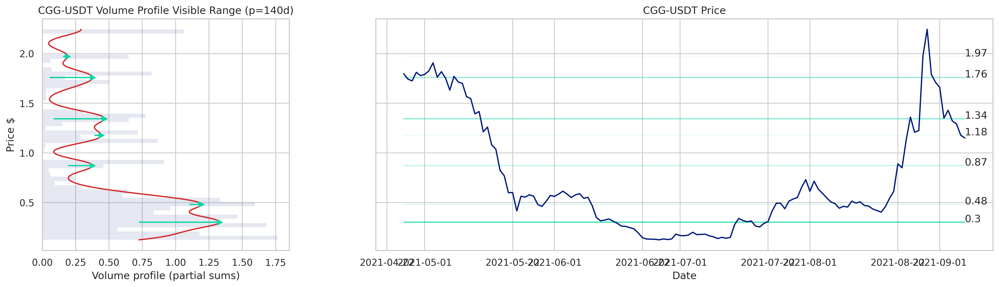

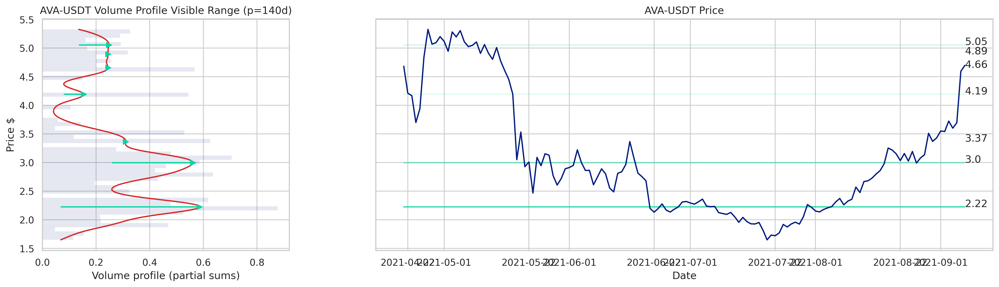

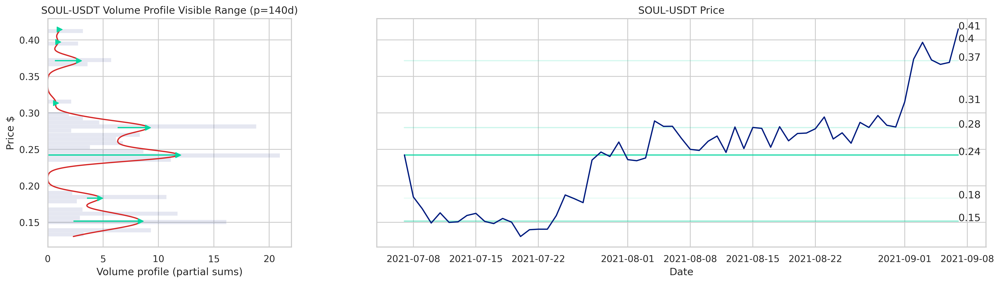

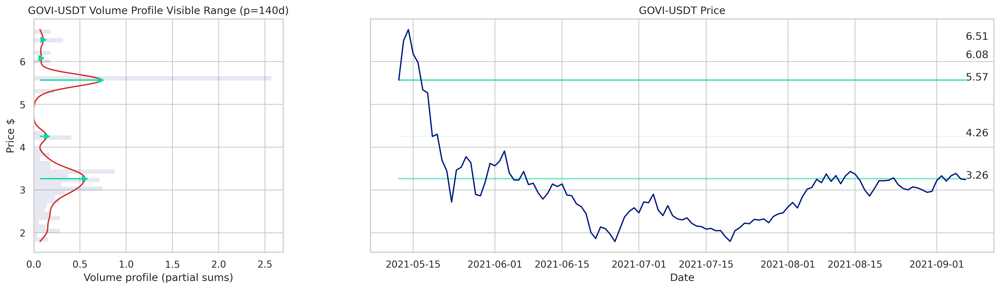

In [15]:
# ticks = ['DAG-USDT','LTX-USDT']
#hide_input
print('Time executed:', datetime.datetime.now())
for tick in KT:
  plot(tick, p=140, kk=True)